# Анализ рынка заведений общественного питания Москвы

<b>Задача анализа: На основе открытых данных подготовить исследование рынка общепита Москвы. Оценить влияние локации, режима работы, типа заведения и среднего чека  на выбор подходящего района и улицы для открытия нового заведения. </b>


1. [Открытие данных](#start)
2. [Предобработка данных](#preprocessing)
3. [Анализ данных](#analysis)
4. [Детализация исследования](#detail)
5. [Подготовка презентации](#presentation)

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from plotly import graph_objects as go
import json
from folium import Map, Choropleth, Marker
from folium.plugins import MarkerCluster

<a id="start"></a> 

**Шаг 1. Загрузка данных и изучение общей информации**

In [2]:
df = pd.read_csv('/Users/ruslangayfullin/DA_New/YP/project_9_caffee_maps/moscow_places.csv')

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


**Описание данных**
***
1. name — название заведения;
2. address — адрес заведения;
3. category — категория заведения, например «кафе», «пиццерия» или «кофейня»;
4. hours — информация о днях и часах работы;
5. lat — широта географической точки, в которой находится заведение;
6. lng — долгота географической точки, в которой находится заведение;
7. rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
8. price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
9. avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
    * «Средний счёт: 1000–1500 ₽»;
    * «Цена чашки капучино: 130–220 ₽»;
    * «Цена бокала пива: 400–600 ₽» и так далее;
10. middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:
    * Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
    * Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
    * Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.
11. middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
    * Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
    * Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
    * Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.
12. chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки);
13. district — административный район, в котором находится заведение, например Центральный административный округ;
14. seats — количество посадочных мест.
***
Датасет содержит информацию о 8406 заведениях города Москвы, и 14 столбцов с характеристиками заведений. В наборе данных присутствуют пропуски значений


<a id="preprocessing"></a> 
**Шаг 2. Выполнение предобработки данных**

Изучение дубликатов в данных. Поиск пропусков

In [4]:
# полные дубликаты
df.duplicated().sum()

0

In [5]:
# неполные дубликаты
df[['name','lat','lng']].duplicated().sum()

0

In [6]:
df[['name']].duplicated().sum()

2792

In [7]:
df[['name']].value_counts().head(10)

name            
Кафе                189
Шоколадница         120
Домино'с Пицца       76
Додо Пицца           74
One Price Coffee     71
Яндекс Лавка         69
Cofix                65
Prime                50
Хинкальная           44
Шаурма               43
dtype: int64

При проверке датасета установлено, что в данных отсутствуют полные дубликаты заведений. Дублирование уцстановлено по названиям, что свидетельствует о наличии сетевых заведений в даатсете. Также в датасете пристутствуют заведения с типовыми названиями "Кафе", "Шаурма", "Ресторан". Вероянтно данные заведения не имеют оригинального названия, либо оно не установлено при формировании датасета
***
Удаление пропусков или заполнение пропусков не произведено. Заполнить пропуски значениями не корректно, так как данные заведений являются независимыми переменными. Удаление также нецесообразно - высок риск потерять важные данные и уменьшить статистическую значимость выборки.

**Выполнение предобработки данных:**
* Создание столбца street с названиями улиц из столбца с адресом.
* Создание столбца is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7):
    * логическое значение True — если заведение работает ежедневно и круглосуточно;
    * логическое значение False — в противоположном случае.

In [8]:
df['street'] = df['address'].apply(lambda x: x.split(',')[1])

In [9]:
df['street'].head()

0               улица Дыбенко
1               улица Дыбенко
2          Клязьминская улица
3     улица Маршала Федоренко
4         Правобережная улица
Name: street, dtype: object

In [10]:
df['is_24/7'] = df['hours'].str.contains('ежедневно') & df['hours'].str.contains('круглосуточно')

<a id="analysis"></a> 
**Шаг 3. Выполнение анализа данных**
***

Оценка категорий заведений, которые представлены в данных. Исследование количества объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и так далее. Построение визуализаций.


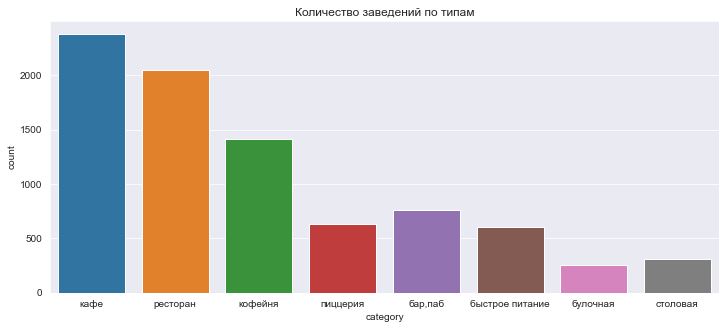

In [11]:
sns.set_style('darkgrid')
plt.figure(figsize=(12,5))
sns.countplot(data = df, x='category')
plt.title('Количество заведений по типам')
plt.show()

In [12]:
category_ratio = (df.category.value_counts() / df.category.value_counts().sum()).reset_index().rename(columns=({'index':'category', 'category':'ratio'}))

fig = go.Figure(data=[go.Pie(labels=category_ratio['category'], 
                             values=category_ratio['ratio'],
                             title='Распределение заведений по категориям')])
fig.show() 

Всего в датасете представлено 8406 завевдений. Более половины всех заведений составляют кафе (28.3%) и рестораны (24.3%). Реже всего встречаются такие форматы как столовая (3.75% заведений) и булочная (3.05%) 
***

**Исследование количества посадочных мест в местах по категориям: рестораны, кофейни, пиццерии, бары и так далее. Построение визуализаций.**


В датасете присутствует 3611 заведений в которых пропущено количество посадочных мест. Предположим, что эти заведения - формата без посадочных мест, такие как кофейни с кофе на вынос, булочные, или пункты выдачи быстрого питания. Проверим категории заведений в которых пропущены посадочные места. Если гипотеза подтвердится - заменим пропуски на 0. Если не подтвердится - оставим пропуски

In [13]:

df[df['seats'].isna() ==True].category.value_counts()

кафе               1160
ресторан            773
кофейня             662
бар,паб             297
быстрое питание     254
пиццерия            206
столовая            151
булочная            108
Name: category, dtype: int64

Не установлено зависимости между типом заведения и отсутствием посадочных мест. Пропуски распределены по всем типам категорий датасета

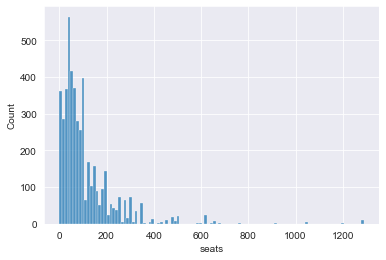

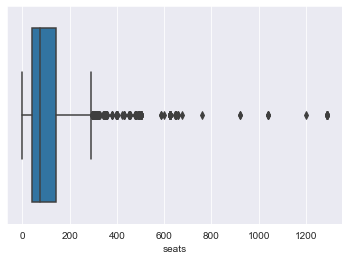

In [14]:
# Установим выбросы и некорректные значения в количестве посадочных мест
sns.histplot(df.seats)
plt.show()
sns.boxplot(data=df, x=df.seats)
plt.show()

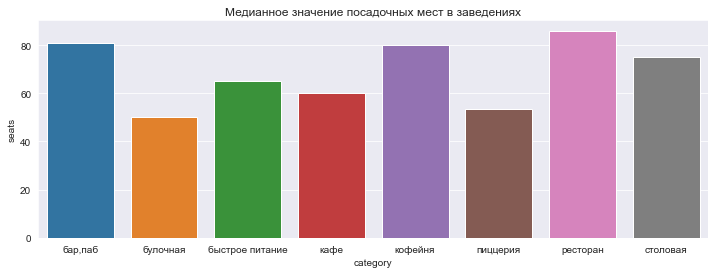

In [15]:
#все что выше тресхот посадочных мест - выбросы, однако до 800 встречаются достаточно часто. 
# Отсечем значения вышее 800
plt.figure(figsize =(12,4))
sns.barplot(data = df.query('seats < 800').groupby('category', as_index=False).agg({"seats":'median'}),
            x='category', 
            y = 'seats')
plt.title('Медианное значение посадочных мест в заведениях');

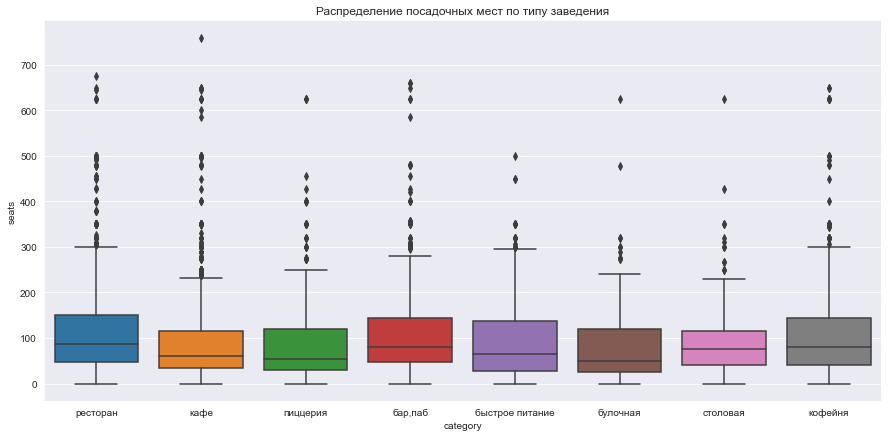

In [16]:
plt.figure(figsize =(15,7));
sns.boxplot(data=df.query('seats < 800'), x = 'category', y='seats' )
plt.title('Распределение посадочных мест по типу заведения');

На представленных графиках видно, что медианные значения количества посадочных мест для ресторанов, кафе и баров примерно одинаковы, и находятся на уровне 80 мест, с небольшим превышением посадочных мест в ресторанах. При этом на графике видно, что для заведений с количеством мест свыше 300 более характерен тип "Ресторан", "Кофейня" или "Быстрое питание". Большие заведения в категории "Булочная","Кафе" или "Столовая" встречаютсся крайне редко

Рассмотрите и изобразите соотношение сетевых и несетевых заведений в датасете. Каких заведений больше?

In [17]:

df_chain = df.groupby('chain',as_index=False)['chain'].count()
df_chain['ratio'] = df_chain['chain'] /  len(df)

In [18]:
fig = go.Figure(data=[go.Pie(labels=['не сетевые заведения','сетевые заведения'], 
                             values=df_chain['ratio'],
                            title='соотношение сетевых и не сетевых заведений')])

fig.show() 


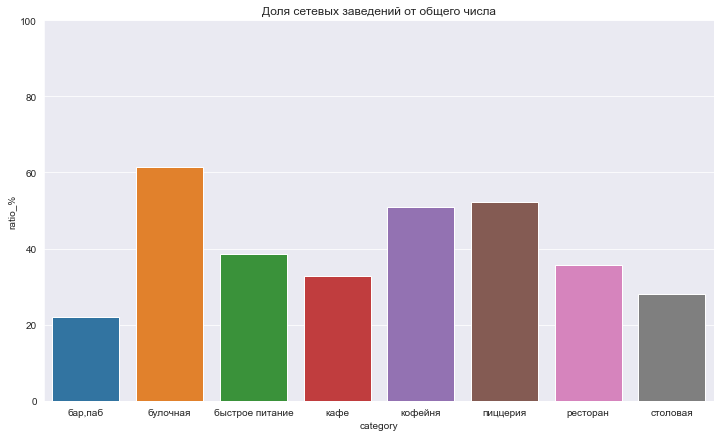

In [19]:
chain_group = df.groupby('category',as_index=False)['chain'].agg(['sum','count']).reset_index()
chain_group['ratio_%'] = round((chain_group['sum'] / chain_group['count'])*100,2)
chain_group


plt.figure(figsize =(12,7))
sns.barplot(data = chain_group,
            y = 'ratio_%',
            x = 'category')
plt.title('Доля сетевых заведений от общего числа')
plt.ylim((0,100));


график рассчета доли сетевых заведений от общего количества зваедений разного типа показывает что более 60% булочных являются сетевыми. Тажке более половины всех кофеен и пиццерий представленных в наборе данных - сетевые заведения

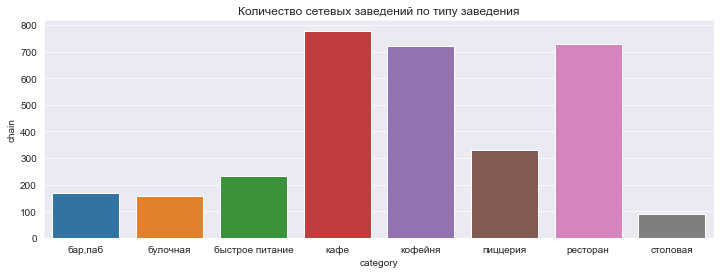

In [20]:
plt.figure(figsize =(12,4))
sns.barplot(data = df.groupby('category',as_index=False)['chain'].sum(),
            x = 'category',
            y = 'chain')
plt.title('Количество сетевых заведений по типу заведения');

Группировка данных по названиям заведений и определение топ-15 популярных сетей в Москве.  Отображение общего количества заведений и количества заведений каждой категории по районам.


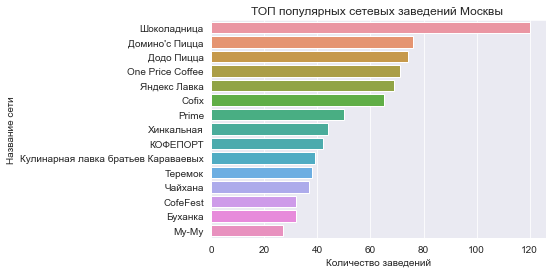

In [21]:
popular = df[(df['chain']==1)].value_counts('name').reset_index().head(15)
popular.columns = ['name','count']

sns.barplot(data = popular, y = 'name', x = 'count')
plt.xlabel('Количество заведений')
plt.ylabel('Название сети')
plt.title('ТОП популярных сетевых заведений Москвы ');

In [22]:
#оставим в датасете только сетевые заведения, входящие в топ-15 в Москве
pop_list = list(popular["name"])
df_popular = df.query('name in @pop_list')

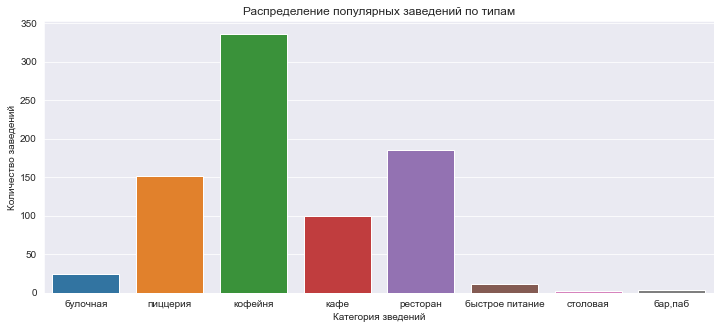

In [23]:
plt.figure(figsize=(12,5))
sns.countplot(data=df_popular, x = 'category')
plt.xlabel('Категория зведений')
plt.ylabel('Количество заведений')
plt.title('Распределение популярных заведений по типам');

На графиках выше представлен топ сетевых заведений по количеству заведений в Москве по названию и по типу заведений. Среди популярных сетевых заведений чаще всего встречаются кофейни, рестораны и пиццерии. В меньшей степени в датасете представлены сетевые столовые и бары.  

In [24]:
df_pop_grouped = df_popular.pivot_table(index='district', columns='category', values='name', aggfunc ='count')

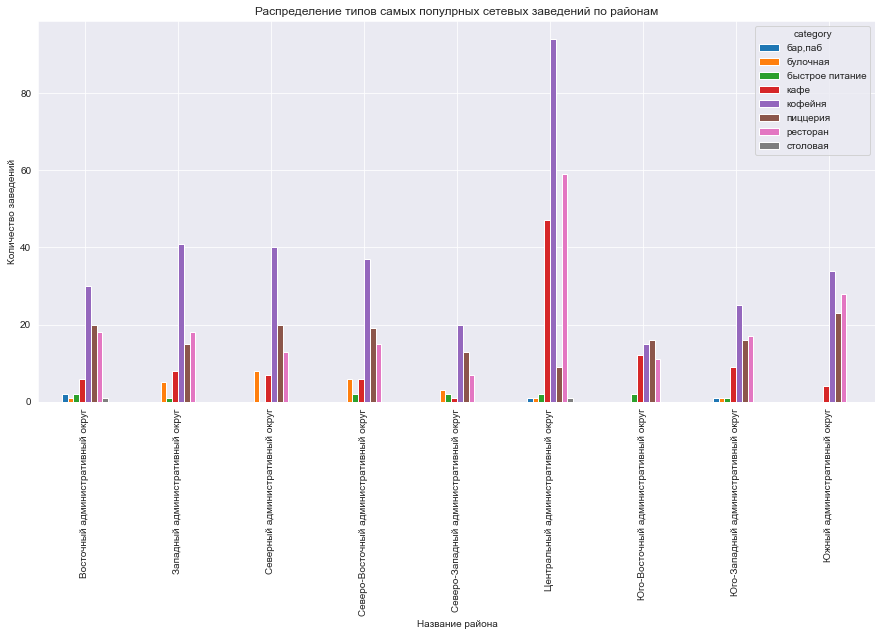

In [25]:
df_pop_grouped.plot(kind='bar',figsize=(15,7));
plt.xlabel('Название района')
plt.ylabel('Количество заведений')
plt.title('Распределение типов самых популрных сетевых заведений по районам');
plt.show()

Говоря о распределении по районам, можно отметить, что среди самых популярных сетевых заведений, во всех районах кроме ЮВАО преобладают сетевые кофейни. Больше всего кофеен размещено в ЦАО. На втором месте пиццерии.

**Определение административных районов Москвы, которые присутствуют в датасете. Визуализация распределения средних рейтингов по категориям заведений.**


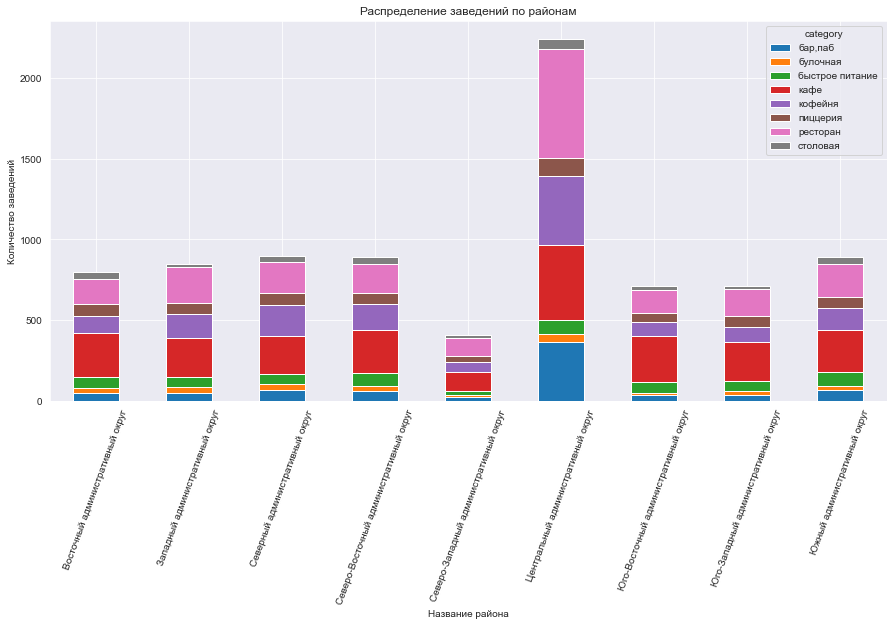

In [26]:

df.pivot_table(index='district', 
               columns='category',
               values='name', 
               aggfunc ='count').plot(kind='bar', 
                                    stacked=True,
                                    figsize=(15,7))
plt.ylabel('Количество заведений')
plt.xlabel('Название района')
plt.xticks(rotation = 70)
plt.title('Распределение заведений по районам');
plt.show()

Анализ по всем заведениям также показывает существенное преобладание заведений общественного питания в ЦАО. Меньше всего заведений располагается в СЗАО. Наиболее популярными типами заведений во всех районах являются рестораны, кафе и кофейни. В ЦАО также высоко распространены бары и пабы.

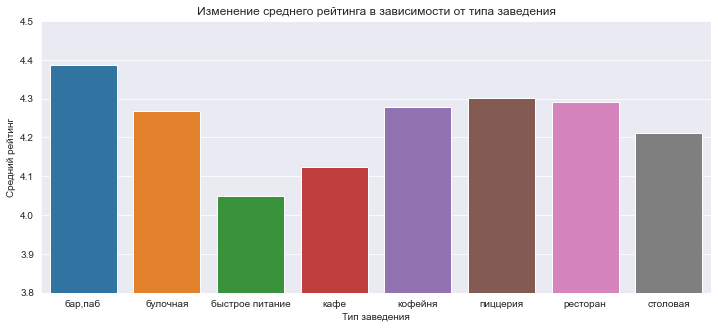

In [27]:
plt.figure(figsize=(12,5))
sns.barplot(data = df.groupby('category',as_index=False)['rating'].mean(), x ='category', y ='rating')
plt.ylabel('Средний рейтинг')
plt.ylim((3.8,4.5))
plt.xlabel('Тип заведения')
plt.title('Изменение среднего рейтинга в зависимости от типа заведения');
plt.show()

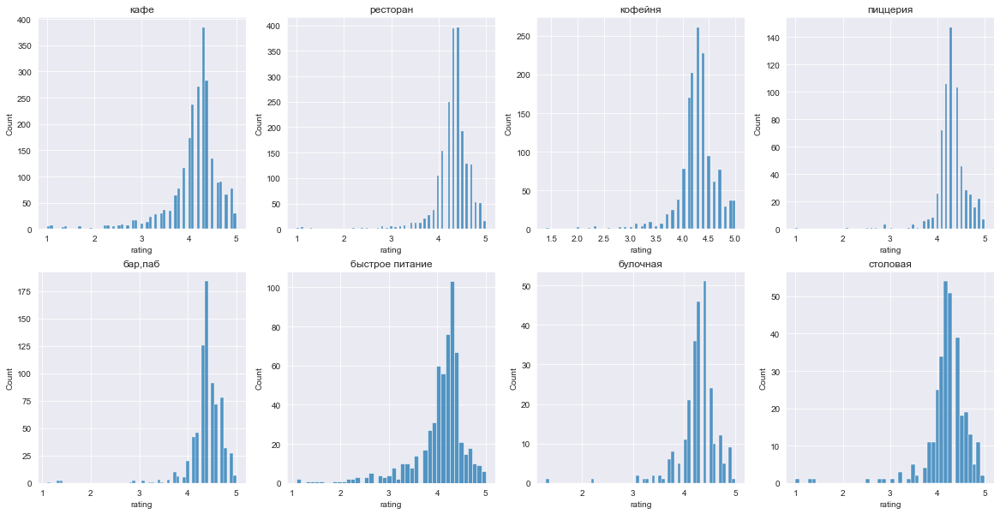

In [28]:
plt.figure(figsize=(20,10))
for i, category in enumerate(df['category'].unique()):
    
    sns.histplot(data = df[df['category'] == category], 
                 x = 'rating',
                 ax = plt.subplot(2,4, i+1))
    
    plt.title(category);


Средний рейтинг всех заведений колеблется от 4 до 4.4 баллов из 5. Наименьший средний рейтинг у ресторанов быстрого питания, а самая лояльная аудитория, которая ставит высокие оценки - у баров и пабов. Гистограммы показывают, что низкие значения баллов, от 1 до 2.5 чаще всего встречаются у ресторанов, кафе и ресторанов быстрого питания. Меньше всего низких баллов поставили булочным, пиццериям и барам

Построение картограммы со средним рейтингом заведений каждого района.

In [29]:
with open('/Users/ruslangayfullin/DA_New/YP/project_9_caffee_maps/admin_level_geomap.geojson', 'r',encoding="utf8") as f:
    geo_json = json.load(f)
    
geo_data = geo_json
moscow_lat, moscow_lng = 55.751244, 37.618423
m = Map(location = [moscow_lat, moscow_lng],zoom_start=10)
Choropleth(
    geo_data = geo_data,
    data = df.groupby('district',as_index=False)['rating'].mean(),
    columns=['district','rating'],
    key_on = 'feature.name',
    fill_opacity = 0.8,
    legend_name = 'Среднее значение рейтинга заведений по районам Москвы'
).add_to(m)
m

Картосхема показывает существенное преобладание заведений с высоким рейтингом в Центральном районе Москвы. Наименьший средний рейтинг заведений характерен для ЮВАО

In [30]:
m = Map(location = [moscow_lat, moscow_lng],zoom_start=10)
marker_cluster = MarkerCluster().add_to(m)

def create_clusters (row):
    Marker(
        [row['lat'], row['lng']],
        popup = f"{row['name']} {row['rating']} {row['category']} {row['address']}",
    ).add_to(marker_cluster)
df.apply(create_clusters,axis=1)
m

Определение топ-15 улиц по количеству заведений.


In [31]:
popstreet_group = df.groupby('street',
                                as_index=False)['name'].count().sort_values(by='name',
                                                                            ascending=False).head(15)
popstreet_group_list  = list(popstreet_group["street"])

df_pop_street = df.query('street in @popstreet_group_list')



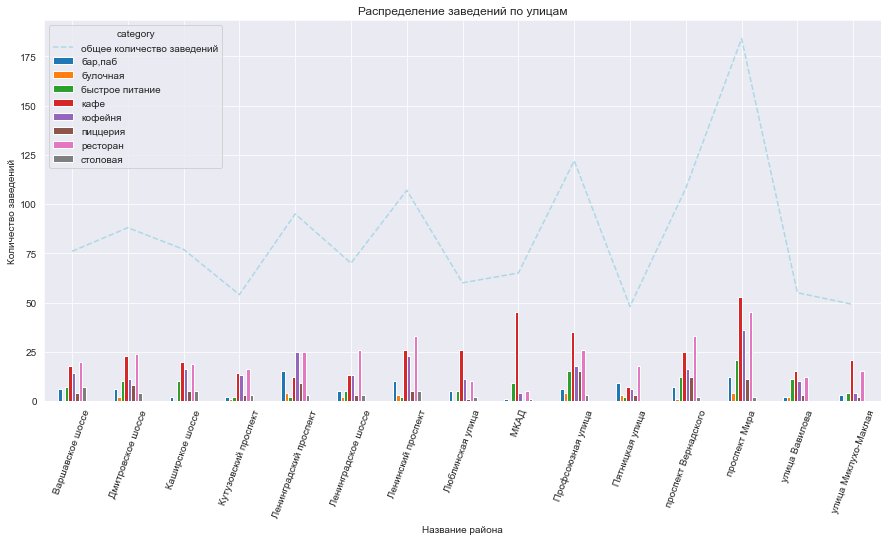

In [32]:

ax1 = df_pop_street.pivot_table(index='street', 
               values='name', 
               aggfunc ='count').reset_index().plot(kind='line', 
                                                    x = 'street', 
                                                    y = 'name', 
                                                    label='общее количество заведений',
                                                   linestyle = '--',
                                                   color='lightblue')
df_pop_street.pivot_table(index='street', 
               columns='category',
               values='name', 
               aggfunc ='count').plot(kind='bar', 
                                    #stacked=True,
                                    figsize=(15,7),ax=ax1)


plt.ylabel('Количество заведений')
plt.xlabel('Название района')
plt.xticks(rotation = 70)
plt.title('Распределение заведений по улицам');
plt.show()


                                      

Среди наиболее популярных улиц, больше всего заведений расоложено на улице Проспект Мира - более 170 точек общепита. По всем отобранным улицам, больше всего распространеныы кафе, ерстораны и кофейни. Сдери всех улиц выделяется МКАД - учитывая типологию данной улицы, явно выделяются кафе, тогда как иных видов общепита существенно меньше

Определение улиц, на которых находится только один объект общепита.

In [33]:
not_popstreet_group = df.groupby('street',
            as_index=False)['name'].count().sort_values(by='name').query('name == 1')
not_popstreet_group_list = list(not_popstreet_group["street"]) 

df_not_pop_street = df.query('street in @not_popstreet_group_list')


In [34]:
print('количество улиц, на которых размещен только один объект общепита:', len(not_popstreet_group))

количество улиц, на которых размещен только один объект общепита: 458


In [35]:
df['street'].nunique()

1448

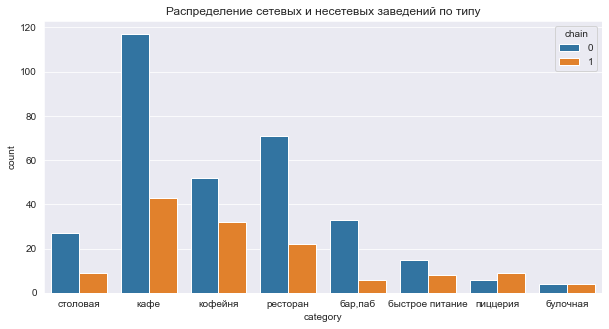

In [36]:
plt.figure(figsize=(10,5))
sns.countplot(data = df_not_pop_street, x ='category', hue='chain');
plt.title('Распределение сетевых и несетевых заведений по типу');

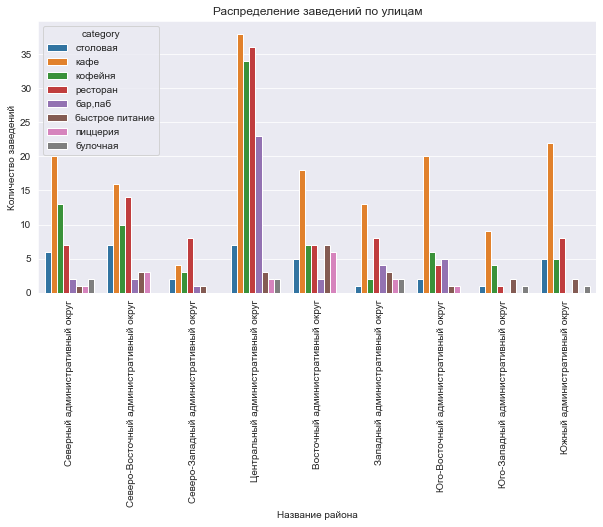

In [37]:
plt.figure(figsize=(10,5))
sns.countplot(data = df_not_pop_street, x ='district', hue='category')
plt.ylabel('Количество заведений')
plt.xlabel('Название района')
plt.xticks(rotation = 90)
plt.title('Распределение заведений по улицам');
plt.show()

Среди 1448 улиц в Датасете, на 458 улицах (31%) размещена всего одна точка общепита. Как и по всему Датасету в целом, чаще всего такими заведениями являются кафе, рестораны и кофейни, расположенные в ЦАО.

In [38]:
moscow_lat, moscow_lng = 55.751244, 37.618423
m = Map(location = [moscow_lat, moscow_lng],zoom_start=10)
Choropleth(
    geo_data = geo_data,
    data = df.groupby('district',as_index=False)['middle_avg_bill'].mean(),
    columns=['district','middle_avg_bill'],
    key_on = 'feature.name',
    fill_opacity = 0.8,
    legend_name = 'Среднее значение чека по районам Москвы'
).add_to(m)
m

Очевидно, что самый высокий средний чек по всем заведениям - в ЦАО. При этом на карте также выделяется западный административный округ. В нём средний чек составляет от 1000 до 1100 рублей. Наименьшее значение среднего чека, примерно от 650 до 750 рублей - в юго-восточном и и северо-восточном округах Москвы

<a id="detail"></a> 
**Шаг 4. Детализация исследования: открытие кофейни**
---
Ответ на следующие вопросы:
- Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?
- Есть ли круглосуточные кофейни?
- Какие у кофеен рейтинги? Как они распределяются по районам?
- На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?


In [39]:
df_cofee = df.query('category == "кофейня" ')
print('Всего заведений категории "Кофейня" в датасете:',df_cofee.shape[0])

Всего заведений категории "Кофейня" в датасете: 1413


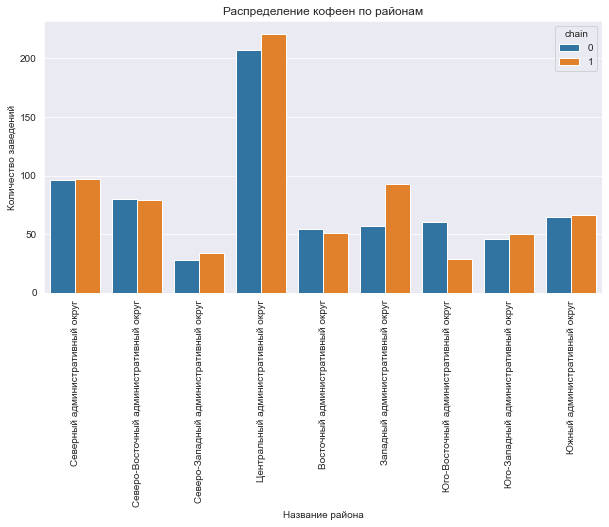

In [40]:
plt.figure(figsize=(10,5))
sns.countplot(data = df_cofee, x ='district', hue='chain')
plt.ylabel('Количество заведений')
plt.xlabel('Название района')
plt.xticks(rotation = 90)
plt.title('Распределение кофеен по районам');
plt.show()

In [41]:
cafee_ratio = (df_cofee.district.value_counts() / df_cofee.district.value_counts().sum()).reset_index().rename(columns=({'index':'district', 'district':'ratio'}))

fig = go.Figure(data=[go.Pie(labels=cafee_ratio['district'], values=cafee_ratio['ratio'],title='Распределение кофеен по районам')])
fig.show() 

In [42]:
df_cofee_24 = df_cofee.groupby('is_24/7',as_index=False)['name'].count()
df_cofee_24['ratio'] = df_cofee_24['name'] / len(df_cofee)


fig = go.Figure(data=[go.Pie(labels=['не курглосуточные кофейни','курглосуточные кофейни'], 
                             values=df_cofee_24['ratio'],title='доля круглосуточных кофеен')])


fig.show() 

Наибольшее количество кофеен расположено в ЦАО - 30.3%. Там же располагается большее число сетевых заведений. В целом по всему датасету число сетевых кофеен сопоставимо с несетевыми. Круглосуточных заведений в датасете всего 4.2%

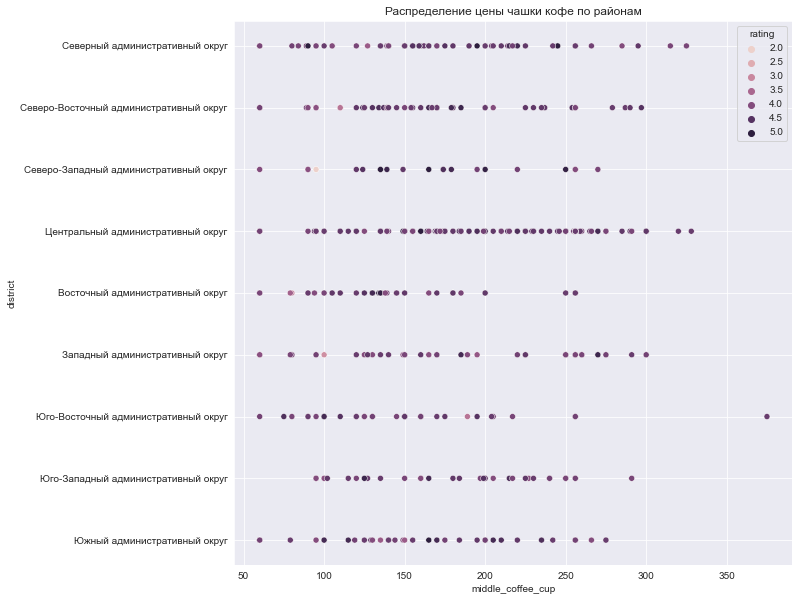

In [43]:
plt.figure(figsize =(10,10));
sns.scatterplot(data = df_cofee.query('middle_coffee_cup < 1400'),x='middle_coffee_cup', y = 'district',hue='rating');
plt.title('Распределение цены чашки кофе по районам');

График распределения показывает что относительно дешевый кофе чаще всего можно встретить в ЮАО, ЮВАО, ВАО и САО. Явно видно что во всех районах можно найти кофе по одинаковой цене, например 60 рублей. Это сказывается наличие сетевых кофеен в датасете, в которых фиксированная цена независимо от места расположения.

<Figure size 432x288 with 0 Axes>

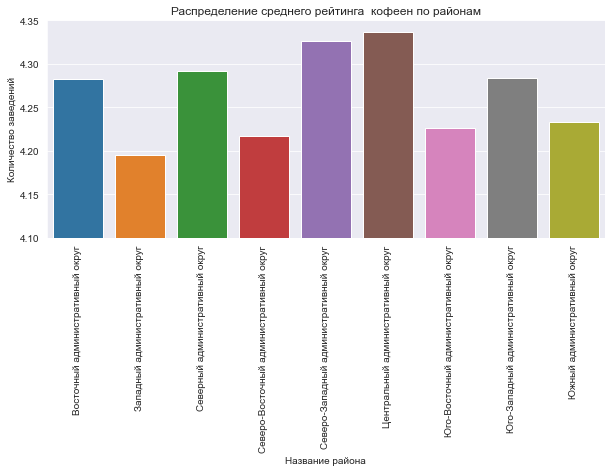

In [44]:
plt.figure()
plt.figure(figsize =(10,4))
sns.barplot(data = df_cofee.groupby('district',as_index=False)['rating'].mean(), x='district',y='rating')
plt.ylabel('Количество заведений')
plt.ylim((4.1,4.35))
plt.xlabel('Название района')
plt.xticks(rotation = 90)
plt.title('Распределение среднего рейтинга  кофеен по районам')


plt.show();

- Распределение среднего рейтинга  кофеен по районам показывает, что лидерами по рейтингу являются ЦАО и СЗАО. Средний рейтинг кофеен в данных районах превышает 4.3 балла из 5
- Выше 4.25 баллов у ВАО, САО и ЮАЗ.
- Самый низкий средний рейтинг у кофеен ЗАО. Менее 4.2 балла

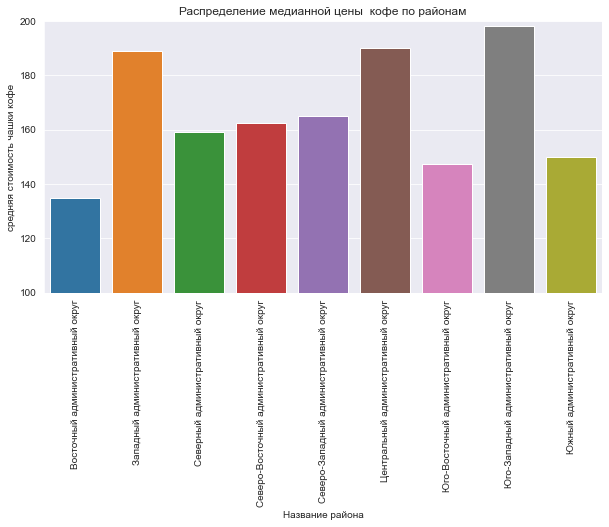

In [45]:
plt.figure(figsize =(10,5));
sns.barplot(data = df_cofee.groupby('district',as_index=False)['middle_coffee_cup'].median(),
            x='district',
            y='middle_coffee_cup')
plt.ylabel('средняя стоимость чашки кофе')
plt.ylim((100,200))
plt.xlabel('Название района')
plt.xticks(rotation = 90)
plt.title('Распределение медианной цены  кофе по районам');

- Самая дорогая средняя цена чашки кофе в ЮЗАО, достигает практически 200 рублей
- Сопоставимые цены в ЦАО и ЗАО - свыше 180 рублей за чашку
- Самый дешевый кофе, судя по средним значениям, в ВАО. Его цена ниже 140 рублей

**Определение приоритетного района и улиц, для открытия новой кофейни на основе открытых данных**

In [46]:
m = Map(location = [moscow_lat, moscow_lng],zoom_start=10)
marker_cluster = MarkerCluster().add_to(m)

def create_clusters (row):
    Marker(
        [row['lat'], row['lng']],
        popup = f"{row['name']} {row['rating']} {row['address']}",
    ).add_to(marker_cluster)
df_cofee.apply(create_clusters,axis=1)
m

In [47]:
m = Map(location = [moscow_lat, moscow_lng],zoom_start=10)
Choropleth(
    geo_data = geo_data,
    data = df_cofee.groupby('district',as_index=False)['middle_coffee_cup'].median(),
    columns=['district','middle_coffee_cup'],
    key_on = 'feature.name',
    fill_opacity = 0.8,
    legend_name = 'Среднее стоимость чашки кофе в районах москвы'
).add_to(m)
m

In [48]:
m = Map(location = [moscow_lat, moscow_lng],zoom_start=10)
Choropleth(
    geo_data = geo_data,
    data = df_cofee.groupby('district',as_index=False)['name'].count(),
    columns=['district','name'],
    key_on = 'feature.name',
    fill_opacity = 0.8,
    legend_name = 'Количество кофеен в районах москвы'
).add_to(m)
m

In [49]:
m = Map(location = [moscow_lat, moscow_lng],zoom_start=10)
Choropleth(
    geo_data = geo_data,
    data = df_cofee.groupby('district',as_index=False)['rating'].mean(),
    columns=['district','rating'],
    key_on = 'feature.name',
    fill_opacity = 0.8,
    legend_name = 'Средний рейтинг кофеен в районах москвы'
).add_to(m)
m

In [50]:
cofee_uzao = df_cofee.query('district == "Юго-Западный административный округ"')

In [51]:
cofee_uzao_street = cofee_uzao.pivot_table(index='street',values = 'name',aggfunc = 'count').rename(columns=({'name':'count'}))
print('Улицы ЮЗАО, в которых расположена всего одна кофейня')

cofee_uzao_street.query('count == 1')


Улицы ЮЗАО, в которых расположена всего одна кофейня


,count
street,
Воронцовский парк,1
Ленинский проспект (дублёр),1
Ломоносовский проспект,1
МКАД,1
Молодёжная улица,1
Научный проезд,1
Нахимовский проспект,1
Севастопольский проспект,1
Старокалужское шоссе,1


# Вывод
Для определения наилучшего района открытия кофейни построены картосхемы по трем категориям: количества кофеен по районам, срендего чека и среднего ценника чашки кофе. 
- Карта количества кофеен показывает что больше всего кофеен сегодня открыто в ЦАО. Также довольно много кофеен открыто на севере и юге Москвы. При этом на юго-западе и востоке города кофеен существенно меньше.
- Карта среднего рейтинга показывает, что кофейни с высоким рейтингом в основном сосредоточены в центре, а также на северо-западе, юго-западе и востоке города. Худший рейтинг у кофеен на западе и северо-востоке Москвы
- Карта средней стоимости чашки кофе показывает что самый дорогой кофе в москве в среднем в центре, на западе и юго западе города
***
Сопоставляя всю полученную информацию, можно сделать вывод, что инвесторам эффективнее всего открывать кофейню в Юго-Западном округе Москвы по следующим причинам:
1. По сравнению с другими районами города, в данном районе размещено меньше всего кофеен, следовательно конкурировать с существующими сетями будет проще, чем в ЦАО или в северных районах
2. При этом, средний рейтинг кофеен в ЮЗАО выше чем во многих других районах города. Иными словами, в данном районе чаще встречаются хорошие заведения, высоко оцениваемые людьми. Это положительно сказывается на репутации района, позволяет сформировать сообщество лояльных клиентов. 
3. Средний чек в ЮЗАО достаточно высок, по сравнению с большинством других районов города и сопоставим со стоимостью кофе в центре. Это во первых говорит о том, что платежеспособность жителей района в среднем выше чем в других районах, так как они могут обеспечить работу кофеен с высоким ценником, а также создает возможности для повышения привлекательности заведения за счет демпинга цены на старте работы, что гораздо проще сделать в районах с дорогими заведениями вокруг, чем в районах где средняя цена и так низкая.
***
В районе ЮЗАО выбраны улицы, на которых размещена всего одна кофейня. На эти улицы в первую очередь необходимо обратить внимание при выборе локации для кофейни. Дополнительно, при выборе кофейни, необходимо проанализировать 
- количество населения, проживающего или работающего вблизи данных улиц,
- определить портрет потребителя кофейни (половозрастная характеристика, уровень дохода, образование и др.), и сопоставить с портретами жителей на данных улицах
- пешеходную активность и автомобильный трафик на отдельных участках этих улиц,
- характер и стоимость предлагаемых рынком помещений для размещения предприятий общепита
***
**Рекомендации для дальнейшего анализа**  
Дополнительно, при выборе кофейни, на отобранных улицах необходимо
проанализировать
1. количество населения, проживающего или работающего вблизи данных улиц,
2. определить портрет потребителя кофейни (половозрастная характеристика, уровень дохода, образование и др.), и сопоставить с портретами жителей на данных улицах
3. пешеходную активность и автомобильный трафик на отдельных участках этих улиц,
4. характер и стоимость предлагаемых рынком помещений для размещения предприятий общепита
